# Kemiripan Gigi Depan (Front View) — Notebook Belajar

Tujuan notebook ini: **memahami mekanika mengukur kemiripan foto gigi depan tanpa label**, sebagai fondasi untuk *grading* IOTN **Aesthetic Component (AC)** lewat pencocokan ke foto referensi.

Kita akan jalan pelan-pelan:

1. Muat & inspeksi foto
2. Preprocessing (kenapa penting)
3. **Toy embedding** (histogram warna) → lihat kenapa ini *gagal*
4. **DINOv2** (encoder semantik) → embedding yang jauh lebih representatif
5. Matriks cosine similarity + nearest-neighbor
6. Bagaimana ini menjadi *AC grader* (anchor, prototype, evaluasi ordinal)
7. Keterbatasan data & langkah berikutnya

> Catatan data: notebook ini kini memakai dataset uji **`Front Teeth drg Laura`** (foto klinis, nama file = label lemah). Anchor tetap 10 referensi IOTN AC. Set ini bagus untuk *mencoba pipeline*, tapi **belum cukup untuk membangun atau mengevaluasi grader sungguhan** (butuh 10 foto referensi AC resmi + sedikit data validasi berlabel). Bagian 6–7 menjelaskan ini.

## 0. Ide besar: AC grading = masalah *similarity*, bukan *classification*

Skala IOTN Aesthetic Component punya **10 foto referensi** (grade 1 = paling rapi → grade 10 = paling parah). Cara pakainya: cocokkan foto pasien ke referensi yang **paling mirip** → grade-nya keluar.

Artinya kita **tidak butuh melatih model dari nol**. Kita cukup:

```
encoder pretrained  →  embedding vektor  →  cosine similarity ke 10 anchor  →  1-NN / ranking
```

Semua yang menentukan kualitas ada di **seberapa bagus embedding-nya**. Itu sebabnya pilihan encoder (DINOv2) penting, dan itu yang kita eksplorasi di sini.

In [33]:
# === Setup ===
# Jalankan di Mac kamu. torch akan otomatis pakai MPS (Apple Silicon) kalau ada.
# Instalasi (sekali saja, di terminal):
#   pip install torch torchvision timm scikit-learn matplotlib pillow

import glob, os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

import torch

def pick_device():
    if torch.backends.mps.is_available():
        return torch.device("mps")      # Apple Silicon GPU
    if torch.cuda.is_available():
        return torch.device("cuda")
    return torch.device("cpu")

DEVICE = pick_device()
print("Device:", DEVICE)

# Folder foto (notebook ini diasumsikan berada di folder yang sama dengan foto)
# Dukungan HEIC (foto .heic dari iPhone). Kalau pillow-heif belum terpasang,
# file .heic otomatis dilewati (notebook tetap jalan). Install: pip install pillow-heif
HEIC_OK = False
try:
    from pillow_heif import register_heif_opener; register_heif_opener(); HEIC_OK = True
except Exception:
    print("(opsional) pip install pillow-heif  -> agar file .heic ikut terbaca\n")

TEST_DIR = "Front Teeth drg Laura"     # <- dataset uji (drg Laura)
_exts = ("*.png","*.jpg","*.jpeg","*.JPG","*.JPEG","*.PNG","*.heic","*.HEIC")
paths = sorted(set(sum([glob.glob(os.path.join(TEST_DIR, e)) for e in _exts], [])))
if not HEIC_OK:                                    # buang .heic kalau tak bisa dibuka
    skip = [p for p in paths if p.lower().endswith(".heic")]
    paths = [p for p in paths if not p.lower().endswith(".heic")]
    if skip: print(f"Melewati {len(skip)} file .heic (pillow-heif belum terpasang).")
names = [os.path.splitext(os.path.basename(p))[0] for p in paths]   # nama file = label lemah
print(f"{len(paths)} foto uji dari '{TEST_DIR}'")
for n in names: print("  -", n)

Device: mps
18 foto uji dari 'Front Teeth drg Laura'
  - kelas 1 dengan diastema 1
  - kelas 1 dengan diastema 2
  - kelas 1 normal 1
  - kelas 1 normal 2
  - kelas 1 normal 3
  - kelas 1 with crossbite and crowding 1
  - kelas 1 with crowding lower anterior 1
  - kelas 1 with crowding lower anterior 2
  - kelas 1 with crowding, midline shifting, crossbite incisor lateral 1
  - kelas 1 with crowding, midline shifting, crossbite incisor lateral 2
  - kelas 1 with deep bite and protrusion 1
  - kelas 1 with deep bite and protrusion 2
  - kelas 1 with deep bite and protrusion 3
  - kelas 1 with multiple diastema and open bite anterior 1
  - kelas 1 with upper anterior croeding and midline shifting 1
  - kelas 1 with upper anterior croeding and midline shifting 2
  - kelas 1 with upper anterior croeding and midline shifting 3
  - kelas 3


## 1b. CONFIG — parameter yang bisa diutak-atik (DINOv2)

**Nilai DEFAULT di bawah = BENCHMARK AWAL.** Biarkan apa adanya untuk mereproduksi baseline,
atau ubah satu per satu lalu lihat pengaruhnya (pakai Spearman weak-label di Bagian 6d sebagai kompas).

| Param | Default | Opsi | Pengaruh |
|---|---|---|---|
| `encoder` | `dinov2_vits14` | `vits14`(21M) / `vitb14`(86M) / `vitl14`(300M) | Makin besar → fitur lebih kuat, lebih lambat & berat |
| `pooling` | `cls` | `cls` / `mean` | `mean` = rata-rata patch token; sering lebih baik untuk beda halus (susunan gigi) |
| `img_size` | `224` | `224` / `294` / `336` (kelipatan 14) | Lebih besar → detail lebih halus, lebih lambat |
| `temperature` | `0.1` | `0.1`–`0.3` | Kecil = tajam (mirip argmax); besar = grade tertimbang lebih halus/stabil |
| `tta_flip` | `False` | `True`/`False` | `True` = rata-ratakan embedding asli + flip → prediksi lebih **stabil** (bukan lebih "benar") |
| `roi_s_thr` | `0.30` | 0.2–0.4 | Ambang saturasi ROI: turun → lebih ketat memilih gigi putih |
| `roi_v_thr` | `0.55` | 0.45–0.65 | Ambang brightness ROI: naik → hanya piksel sangat terang |
| `roi_pad` | `0.10` | 0–0.15 | Padding di sekeliling gigi: 0 = ketat, 0.15 = longgar |

In [34]:
# ========= CONFIG (DINOv2) — default = BENCHMARK AWAL =========
# Baseline: DINOv2 ViT-S/14 | pooling CLS | img 224 | temperature 0.1 | tanpa TTA | ROI default
CONFIG = {
    "encoder":     "dinov2_vits14",   # vits14(baseline) | vitb14 | vitl14
    "pooling":     "cls",             # "cls"(baseline) | "mean"(rata-rata patch token)
    "img_size":    224,               # 224(baseline) | 294 | 336  (kelipatan 14)
    "temperature": 0.1,               # 0.1(baseline, tajam) .. 0.3(halus)
    "tta_flip":    False,             # True = TTA flip horizontal (lebih stabil)
    "roi_s_thr":   0.30,              # ambang saturasi ROI
    "roi_v_thr":   0.55,              # ambang brightness ROI
    "roi_pad":     0.10,              # padding ROI
}
print("CONFIG DINOv2:", CONFIG)

CONFIG DINOv2: {'encoder': 'dinov2_vits14', 'pooling': 'cls', 'img_size': 224, 'temperature': 0.1, 'tta_flip': False, 'roi_s_thr': 0.3, 'roi_v_thr': 0.55, 'roi_pad': 0.1}


## 1. Muat & inspeksi foto

Perhatikan: ukuran beda-beda, ada yang RGBA, sebagian ada **watermark** ("BTeeth", "before"), framing & pencahayaan tidak konsisten. Semua ini nanti "bocor" ke embedding kalau tidak ditangani — poin penting yang akan kita bahas di preprocessing.

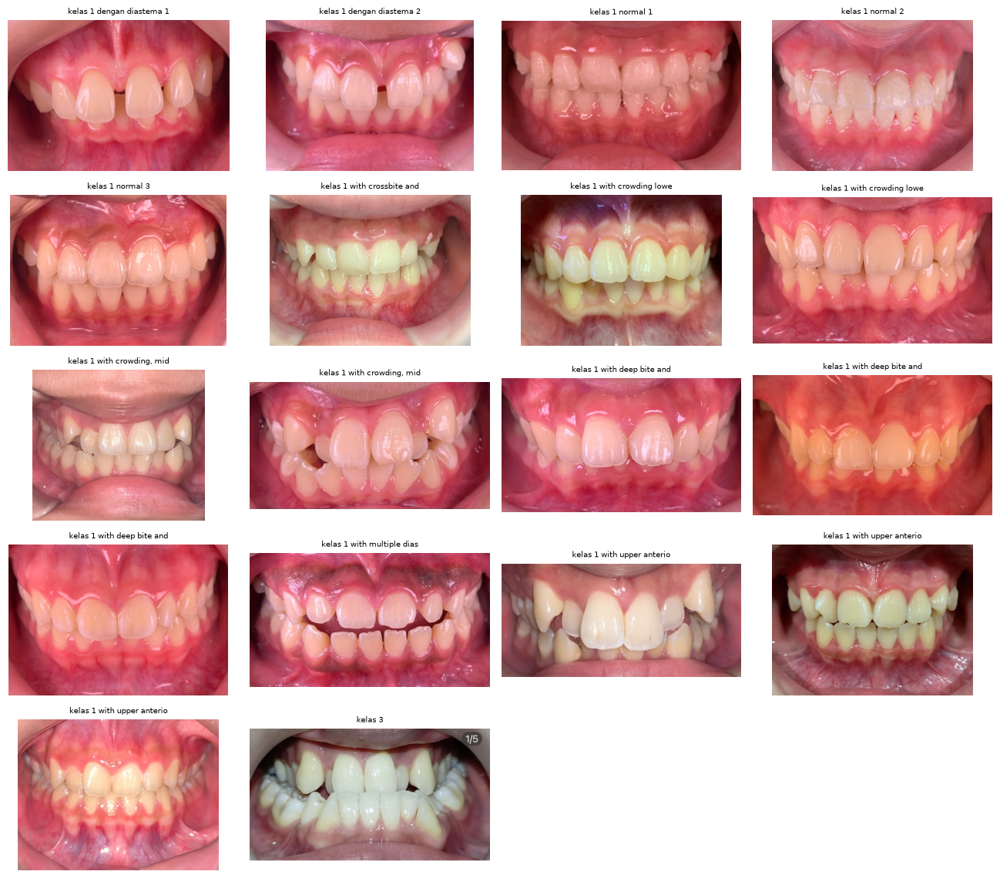

In [35]:
import math
ncol = 4; nrow = math.ceil(len(paths) / ncol)
fig, axes = plt.subplots(nrow, ncol, figsize=(3.3*ncol, 2.3*nrow))
axes = np.array(axes).reshape(-1)
for k, ax in enumerate(axes):
    if k < len(paths):
        im = Image.open(paths[k]).convert("RGB")
        ax.imshow(im); ax.set_title(names[k][:26], fontsize=7)
    ax.axis("off")
plt.tight_layout(); plt.show()

## 2. Preprocessing

Encoder butuh input seragam. Langkah minimum:

- **RGBA → RGB** (buang alpha)
- **Resize** ke ukuran yang diminta model (DINOv2 ViT-S/14 pakai kelipatan 14; kita pakai 224×224)
- **Normalisasi** mean/std ImageNet

**Yang belum kita lakukan (tapi penting untuk data nyata):**

- **Crop ke ROI gigi** — buang bibir/gusi/background/watermark. Ini biasanya *dampaknya lebih besar* daripada memilih model. Untuk sekarang kita skip (dataset kecil), tapi ingat ini bottleneck utama.
- **Koreksi exposure / white-balance** — foto Google pencahayaannya liar.

In [36]:
IMG_SIZE = CONFIG["img_size"]
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225], dtype=np.float32)

def load_rgb(path, size=IMG_SIZE):
    im = Image.open(path).convert("RGB").resize((size, size))
    return np.asarray(im, dtype=np.float32) / 255.0   # HxWx3 in [0,1]

def to_model_tensor(arr):
    x = (arr - IMAGENET_MEAN) / IMAGENET_STD           # normalize
    x = torch.from_numpy(x).permute(2, 0, 1)           # HWC -> CHW
    return x.float()

imgs01 = [load_rgb(p) for p in paths]
print("Contoh tensor:", to_model_tensor(imgs01[0]).shape)

# --- ROI crop: fokus ke region gigi (whitish = saturasi rendah, value tinggi) ---
# Ini upgrade paling berdampak: menyamakan framing anchor & foto uji,
# membuang bibir/gusi/kulit/watermark yang bikin embedding "salah fokus".
def teeth_roi_box(rgb01, s_thr=None, v_thr=None, dens=0.12, pad=None):
    # default diambil dari CONFIG kalau tidak dioverride
    s_thr = CONFIG["roi_s_thr"] if s_thr is None else s_thr
    v_thr = CONFIG["roi_v_thr"] if v_thr is None else v_thr
    pad   = CONFIG["roi_pad"]   if pad   is None else pad
    mx = rgb01.max(-1); mn = rgb01.min(-1)
    v = mx
    s = np.where(mx > 1e-6, (mx - mn) / (mx + 1e-6), 0.0)
    teeth = (s < s_thr) & (v > v_thr)          # piksel gigi (putih: saturasi rendah, value tinggi)
    H, W = teeth.shape
    col, row = teeth.mean(0), teeth.mean(1)

    def center_box(fw=0.8, fh=0.6):            # fallback: crop tengah
        cw, ch = int(W*fw), int(H*fh); x0 = (W-cw)//2; y0 = (H-ch)//2
        return (x0, y0, x0+cw, y0+ch)

    if col.max() < 1e-3 or row.max() < 1e-3:
        return center_box()                    # deteksi kosong -> center crop
    cx = np.where(col > dens * col.max())[0]
    ry = np.where(row > dens * row.max())[0]
    x0, x1, y0, y1 = int(cx.min()), int(cx.max()), int(ry.min()), int(ry.max())
    bw, bh = x1 - x0, y1 - y0
    # guard: kalau box terlalu kecil/tipis (mis. foto berwarna hangat/oranye), pakai center crop
    if bw < 0.25*W or bh < 0.15*H:
        return center_box()
    pw, ph = int(bw*pad), int(bh*pad)
    return (max(0, x0-pw), max(0, y0-ph), min(W, x1+pw), min(H, y1+ph))

def load_roi(path, size=IMG_SIZE):
    """Muat -> crop ROI gigi -> resize. Dipakai untuk SEMUA embedding (anchor & query)."""
    im = Image.open(path).convert("RGB")
    box = teeth_roi_box(np.asarray(im, np.float32) / 255.)
    crop = im.crop(box).resize((size, size))
    return np.asarray(crop, np.float32) / 255.

Contoh tensor: torch.Size([3, 224, 224])


## 3. Pemanasan: *toy embedding* — dan kenapa ia gagal

Sebelum model besar, mari bangun embedding paling sederhana: **histogram warna + grid grayscale kasar**. Ini menangkap "warna & terang-gelap", **bukan** struktur gigi (crowding, spacing, protrusion).

Tujuannya bukan supaya bagus — tapi supaya kamu *melihat sendiri* kenapa embedding lemah bikin semua foto tampak mirip.

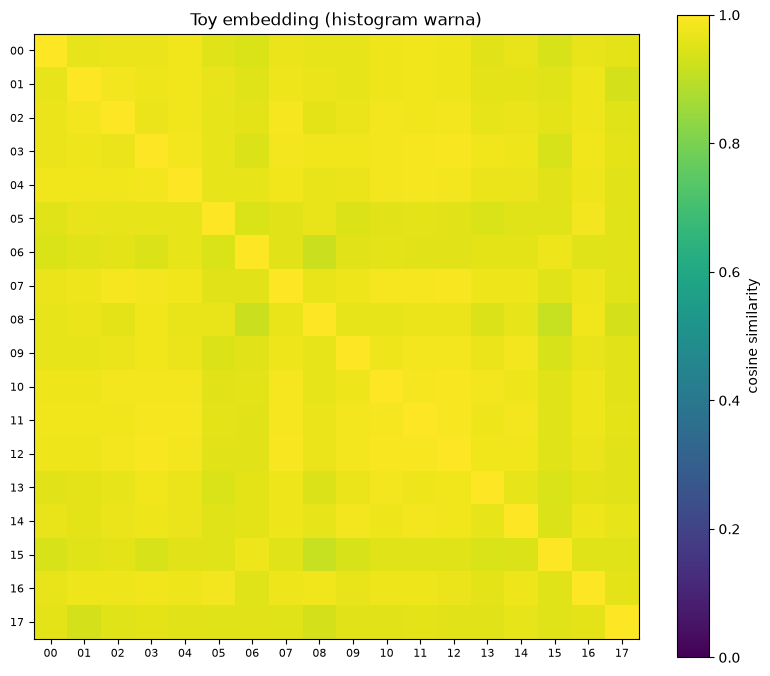

Rentang similarity off-diagonal: 0.92 - 0.99  (semua ~mirip = toy 'buta' susunan gigi)
indeks -> nama:
  00 = kelas 1 dengan diastema 1
  01 = kelas 1 dengan diastema 2
  02 = kelas 1 normal 1
  03 = kelas 1 normal 2
  04 = kelas 1 normal 3
  05 = kelas 1 with crossbite and crowding 1
  06 = kelas 1 with crowding lower anterior 1
  07 = kelas 1 with crowding lower anterior 2
  08 = kelas 1 with crowding, midline shifting, crossbite incisor lateral 1
  09 = kelas 1 with crowding, midline shifting, crossbite incisor lateral 2
  10 = kelas 1 with deep bite and protrusion 1
  11 = kelas 1 with deep bite and protrusion 2
  12 = kelas 1 with deep bite and protrusion 3
  13 = kelas 1 with multiple diastema and open bite anterior 1
  14 = kelas 1 with upper anterior croeding and midline shifting 1
  15 = kelas 1 with upper anterior croeding and midline shifting 2
  16 = kelas 1 with upper anterior croeding and midline shifting 3
  17 = kelas 3


In [37]:
def toy_embed(arr):
    g = np.asarray(Image.fromarray((arr*255).astype("uint8")).convert("L").resize((16,16)),
                   dtype=np.float32).flatten() / 255.0
    hist = np.concatenate([np.histogram(arr[:,:,c], bins=16, range=(0,1))[0] for c in range(3)]).astype(np.float32)
    hist /= (hist.sum() + 1e-8)
    v = np.concatenate([g, hist])
    return v / (np.linalg.norm(v) + 1e-8)

toy = np.stack([toy_embed(a) for a in imgs01])
S_toy = cosine_similarity(toy)

idx = [f"{i:02d}" for i in range(len(names))]        # label pendek (nama klinis terlalu panjang)
sz = max(6, len(names)*0.45)
plt.figure(figsize=(sz, sz*0.85))
plt.imshow(S_toy, cmap="viridis", vmin=0, vmax=1)
plt.xticks(range(len(names)), idx, fontsize=8); plt.yticks(range(len(names)), idx, fontsize=8)
plt.colorbar(label="cosine similarity"); plt.title("Toy embedding (histogram warna)")
plt.tight_layout(); plt.show()

off = S_toy[~np.eye(len(names), dtype=bool)]
print(f"Rentang similarity off-diagonal: {off.min():.2f} - {off.max():.2f}  (semua ~mirip = toy 'buta' susunan gigi)")
print("indeks -> nama:")
for i, n in enumerate(names): print(f"  {i:02d} = {n}")

**Observasi:** semua pasangan ~0.9+ — nyaris tak terbedakan. Embedding ini "buta" terhadap susunan gigi. Inilah alasan kita butuh encoder **semantik** yang belajar fitur bentuk/struktur, bukan sekadar warna. Masuk ke DINOv2.

## 3b. ROI crop — samakan framing ke region gigi

Sebelum embedding, tiap foto dipotong otomatis ke area gigi (`teeth_roi_box`). Ini
menghilangkan variasi bibir/kulit/pencahayaan/watermark yang tidak relevan, sehingga
kemiripan mencerminkan **susunan gigi**, bukan penampilan mulut secara umum. Ini
biasanya perbaikan **terbesar** untuk akurasi matching.

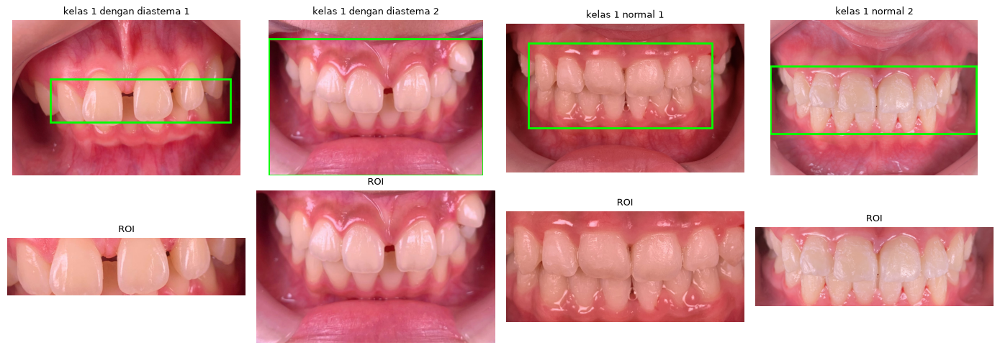

In [38]:
from matplotlib.patches import Rectangle
prev = paths[:4] + anchor_paths[:4] if 'anchor_paths' in dir() else paths[:4]
fig, ax = plt.subplots(2, 4, figsize=(14, 5))
for k, pth in enumerate(paths[:4]):
    im = Image.open(pth).convert("RGB"); box = teeth_roi_box(np.asarray(im, np.float32)/255.)
    ax[0,k].imshow(im); ax[0,k].add_patch(Rectangle((box[0],box[1]),box[2]-box[0],box[3]-box[1],fill=False,edgecolor="lime",lw=2))
    ax[0,k].set_title(names[k],fontsize=9); ax[0,k].axis("off")
    ax[1,k].imshow(im.crop(box)); ax[1,k].set_title("ROI",fontsize=9); ax[1,k].axis("off")
plt.tight_layout(); plt.show()

## 4. DINOv2 — encoder semantik (rekomendasi utama)

**DINOv2 ViT-S/14** (self-supervised, ~21M param) menghasilkan embedding yang kuat untuk kemiripan **tanpa fine-tuning**. Jalan enak di MPS. Kita ambil `CLS` token (vektor global) sebagai embedding per foto.

Load pertama kali akan mengunduh bobot (~85 MB) dari `torch.hub`.

In [39]:
# Load DINOv2 ViT-S/14 dari torch.hub (butuh internet sekali untuk unduh bobot)
# BENCHMARK AWAL: dinov2_vits14 (ubah via CONFIG["encoder"])
model = torch.hub.load("facebookresearch/dinov2", CONFIG["encoder"])
model.eval().to(DEVICE)
print(f"Loaded {CONFIG['encoder']} | embedding dim:", model.embed_dim)

Using cache found in /Users/rdrusdiati/.cache/torch/hub/facebookresearch_dinov2_main


Loaded dinov2_vits14 | embedding dim: 384


In [40]:
@torch.no_grad()
def _feat(arr):
    x = to_model_tensor(arr).unsqueeze(0).to(DEVICE)
    out = model.forward_features(x)                    # dict: x_norm_clstoken / x_norm_patchtokens
    if CONFIG["pooling"] == "mean":
        return out["x_norm_patchtokens"][0].mean(0)    # rata-rata patch token
    return out["x_norm_clstoken"][0]                    # CLS token (baseline)

@torch.no_grad()
def dino_embed(arr):
    """ROI array -> embedding DINOv2 sesuai CONFIG (pooling + optional TTA flip)."""
    f = _feat(arr)
    if CONFIG["tta_flip"]:
        f = f + _feat(np.ascontiguousarray(arr[:, ::-1, :]))   # + flip horizontal
    v = f.float().cpu().numpy()
    return v / (np.linalg.norm(v) + 1e-8)

In [41]:
# Embed versi ROI-crop (bukan gambar mentah) -> fokus ke gigi
dino_imgs = [load_roi(p) for p in paths]
dino = np.stack([dino_embed(a) for a in dino_imgs])
print("Embeddings:", dino.shape)

Embeddings: (18, 384)


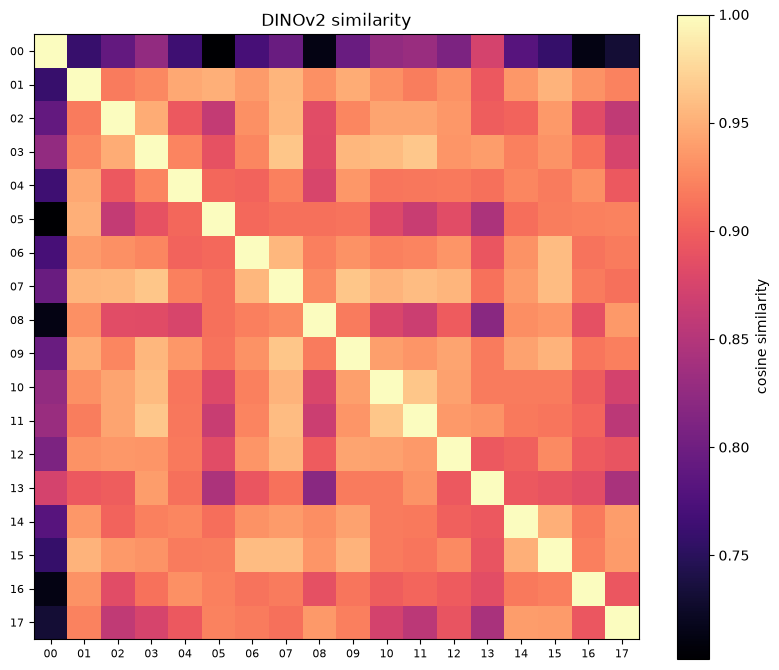

Off-diagonal range: 0.70 - 0.97  (harusnya lebih menyebar daripada toy)
indeks -> nama:
  00 = kelas 1 dengan diastema 1
  01 = kelas 1 dengan diastema 2
  02 = kelas 1 normal 1
  03 = kelas 1 normal 2
  04 = kelas 1 normal 3
  05 = kelas 1 with crossbite and crowding 1
  06 = kelas 1 with crowding lower anterior 1
  07 = kelas 1 with crowding lower anterior 2
  08 = kelas 1 with crowding, midline shifting, crossbite incisor lateral 1
  09 = kelas 1 with crowding, midline shifting, crossbite incisor lateral 2
  10 = kelas 1 with deep bite and protrusion 1
  11 = kelas 1 with deep bite and protrusion 2
  12 = kelas 1 with deep bite and protrusion 3
  13 = kelas 1 with multiple diastema and open bite anterior 1
  14 = kelas 1 with upper anterior croeding and midline shifting 1
  15 = kelas 1 with upper anterior croeding and midline shifting 2
  16 = kelas 1 with upper anterior croeding and midline shifting 3
  17 = kelas 3


In [42]:
S = cosine_similarity(dino)

idx = [f"{i:02d}" for i in range(len(names))]
sz = max(6, len(names)*0.45)
plt.figure(figsize=(sz, sz*0.85))
plt.imshow(S, cmap="magma", vmin=S.min(), vmax=1)
plt.xticks(range(len(names)), idx, fontsize=8); plt.yticks(range(len(names)), idx, fontsize=8)
plt.colorbar(label="cosine similarity"); plt.title("DINOv2 similarity")
if len(names) <= 12:                                   # teks per-sel hanya kalau tak terlalu ramai
    for i in range(len(names)):
        for j in range(len(names)):
            plt.text(j, i, f"{S[i,j]:.2f}", ha="center", va="center",
                     color="white" if S[i,j] < 0.7 else "black", fontsize=7)
plt.tight_layout(); plt.show()

off = S[~np.eye(len(names), dtype=bool)]
print(f"Off-diagonal range: {off.min():.2f} - {off.max():.2f}  (harusnya lebih menyebar daripada toy)")
print("indeks -> nama:")
for i, n in enumerate(names): print(f"  {i:02d} = {n}")

## 5. Nearest neighbor — "foto paling mirip"

Untuk tiap foto, tampilkan tetangga terdekatnya. Di data nyata, "tetangga" ini adalah **anchor AC** yang menentukan grade.

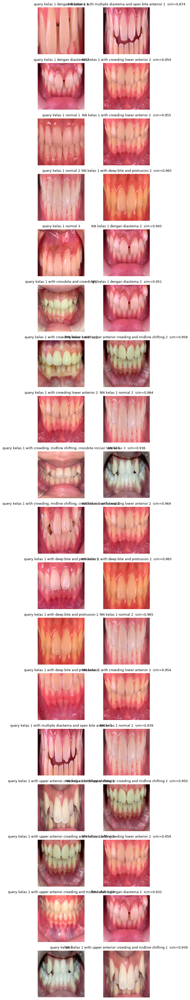

In [43]:
fig, axes = plt.subplots(len(names), 2, figsize=(6, 2.2*len(names)))
for i, n in enumerate(names):
    order = np.argsort(-S[i]); nn = [j for j in order if j != i][0]
    axes[i,0].imshow(dino_imgs[i]); axes[i,0].set_title(f"query {n}", fontsize=9); axes[i,0].axis("off")
    axes[i,1].imshow(dino_imgs[nn]); axes[i,1].set_title(f"NN {names[nn]}  sim={S[i,nn]:.3f}", fontsize=9); axes[i,1].axis("off")
plt.tight_layout(); plt.show()

## 6. Dari similarity -> **AC grader** (anchor SUDAH tersedia)

10 foto referensi AC sudah dipotong jadi `ac_grade_01.png` ... `ac_grade_10.png` di folder ini
(lihat `crop_references.py`), jadi grader-nya **bisa jalan sungguhan** sekarang.

Ingat tiga penguat penting (tiap grade cuma 1 foto):

1. **Prototype embedding** - kalau nanti punya beberapa foto per grade, rata-ratakan embedding-nya.
2. **Sifat ordinal** - AC skala berurutan (1->10); di bawah kita hitung juga **grade tertimbang** (weighted by similarity), bukan cuma `argmax`.
3. **Evaluasi ordinal** - pakai **MAE** & **within-±1**, butuh set validasi kecil berlabel.

> Catatan: anchor ini masih memuat sedikit overlay angka & belum di-crop ketat ke gigi.
> Untuk hasil lebih bersih, tambahkan ROI crop (lihat Bagian 7).

In [44]:
import glob

# 10 foto referensi hasil crop_references.py
anchor_paths = sorted(glob.glob("ac_references/ac_grade_*.png"))
anchor_grades = list(range(1, len(anchor_paths) + 1))
assert len(anchor_paths) == 10, f"harusnya 10 anchor, dapat {len(anchor_paths)}"

anchor_emb = np.stack([dino_embed(load_roi(p)) for p in anchor_paths])
print("anchor embeddings:", anchor_emb.shape)

@torch.no_grad()
def predict_ac(img_path):
    q = dino_embed(load_roi(img_path))
    sims = cosine_similarity(q[None], anchor_emb)[0]     # similarity ke tiap grade
    hard = anchor_grades[int(np.argmax(sims))]           # 1-NN
    # grade tertimbang (ordinal): softmax similarity sebagai bobot
    w = np.exp(sims / CONFIG['temperature']); w /= w.sum()
    soft = float(np.dot(w, anchor_grades))
    return hard, soft, sims

print("\nPrediksi AC untuk 8 foto Google:")
for p, n in zip(paths, names):
    hard, soft, sims = predict_ac(p)
    top3 = np.argsort(-sims)[:3]
    print(f"  {n}: AC(1-NN)={hard:>2}  AC(weighted)={soft:4.1f}   "
          f"top-3 grade={[anchor_grades[i] for i in top3]}  sims={np.round(sims[top3],3)}")

# --- Evaluasi (isi kalau sudah punya label) ---
# y_true = [...]; preds = [predict_ac(p)[0] for p in val_paths]
# import numpy as np
# mae = np.mean(np.abs(np.array(y_true) - np.array(preds)))
# within1 = np.mean(np.abs(np.array(y_true) - np.array(preds)) <= 1)
# print("MAE:", round(mae,2), "| within-±1:", round(within1,2))

anchor embeddings: (10, 384)

Prediksi AC untuk 8 foto Google:
  kelas 1 dengan diastema 1: AC(1-NN)= 9  AC(weighted)= 5.4   top-3 grade=[9, 4, 1]  sims=[0.77  0.76  0.755]
  kelas 1 dengan diastema 2: AC(1-NN)= 4  AC(weighted)= 5.5   top-3 grade=[4, 2, 6]  sims=[0.887 0.886 0.885]
  kelas 1 normal 1: AC(1-NN)= 2  AC(weighted)= 5.4   top-3 grade=[2, 8, 6]  sims=[0.922 0.91  0.906]
  kelas 1 normal 2: AC(1-NN)= 2  AC(weighted)= 5.3   top-3 grade=[2, 4, 8]  sims=[0.905 0.894 0.887]
  kelas 1 normal 3: AC(1-NN)= 4  AC(weighted)= 5.5   top-3 grade=[4, 8, 6]  sims=[0.904 0.888 0.887]
  kelas 1 with crossbite and crowding 1: AC(1-NN)= 4  AC(weighted)= 5.4   top-3 grade=[4, 2, 6]  sims=[0.845 0.845 0.842]
  kelas 1 with crowding lower anterior 1: AC(1-NN)= 8  AC(weighted)= 5.5   top-3 grade=[8, 2, 6]  sims=[0.895 0.888 0.882]
  kelas 1 with crowding lower anterior 2: AC(1-NN)= 2  AC(weighted)= 5.3   top-3 grade=[2, 4, 8]  sims=[0.906 0.898 0.895]
  kelas 1 with crowding, midline shifting, cro

## 6b. Test vs referensi paling mirip

Untuk tiap foto test, tampilkan foto-nya di kiri dan **referensi AC paling mirip** di kanan
(disertai top-3 kandidat + grade & skor cosine). Kolom pertama referensi = match terbaik.

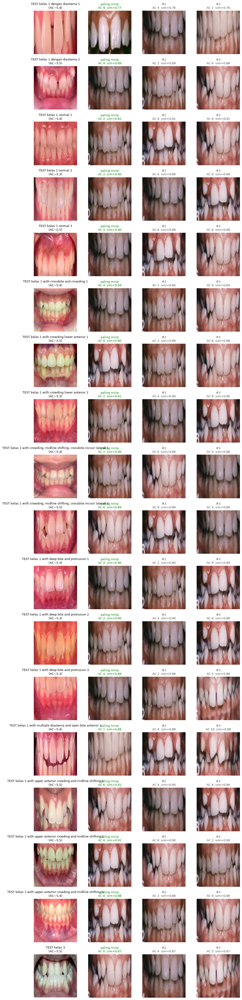

In [45]:
# Foto referensi dalam versi ROI (untuk ditampilkan, konsisten dgn yang di-embed)
anchor_imgs = [load_roi(p) for p in anchor_paths]

TOPK = 3
fig, axes = plt.subplots(len(paths), 1 + TOPK, figsize=(2.4 * (1 + TOPK), 2.4 * len(paths)))
for i, (pth, n) in enumerate(zip(paths, names)):
    _, soft, sims = predict_ac(pth)
    order = np.argsort(-sims)[:TOPK]

    # kolom 0: foto test
    axes[i, 0].imshow(dino_imgs[i]); axes[i, 0].axis("off")
    axes[i, 0].set_title(f"TEST {n}\n(AC~{soft:.1f})", fontsize=9)

    # kolom 1..K: referensi paling mirip
    for k, a in enumerate(order):
        axes[i, k + 1].imshow(anchor_imgs[a]); axes[i, k + 1].axis("off")
        tag = "paling mirip" if k == 0 else f"#{k + 1}"
        axes[i, k + 1].set_title(f"{tag}\nAC {anchor_grades[a]}  sim={sims[a]:.2f}",
                                 fontsize=9, color=("green" if k == 0 else "0.3"))
        if k == 0:  # bingkai hijau utk match terbaik
            for sp in axes[i, k + 1].spines.values():
                sp.set_visible(True); sp.set_color("green"); sp.set_linewidth(2.5)
        axes[i, k + 1].set_xticks([]); axes[i, k + 1].set_yticks([])
plt.tight_layout(); plt.show()

## 6c. Probe: shape vs warna, & konsistensi ordinal

Tiga eksperimen murah (tanpa label) untuk **membuktikan** seberapa besar DINOv2 mengandalkan
bentuk/susunan gigi vs sekadar warna, dan apakah ruang embedding-nya "paham" urutan keparahan AC:

1. **Grayscale test** - kalau warna dibuang tapi ranking/prediksi nyaris tak berubah -> berbasis shape.
2. **White-balance jitter** - kalau warna digeser tapi embedding tetap dekat aslinya -> tahan warna.
3. **Monotonisitas anchor (Spearman)** - jarak embedding antar-anchor naik seiring selisih grade -> ordinal-aware.

In [46]:
# === PROBE 1: shape vs warna (grayscale test) ===
def load_roi_gray(path, size=IMG_SIZE):
    im = Image.open(path).convert("RGB")
    box = teeth_roi_box(np.asarray(im, np.float32) / 255.)
    g = im.crop(box).resize((size, size)).convert("L").convert("RGB")   # buang warna
    return np.asarray(g, np.float32) / 255.

emb_c = np.stack([dino_embed(load_roi(p))      for p in paths])          # warna
emb_g = np.stack([dino_embed(load_roi_gray(p)) for p in paths])          # grayscale
anc_c = np.stack([dino_embed(load_roi(p))      for p in anchor_paths])
anc_g = np.stack([dino_embed(load_roi_gray(p)) for p in anchor_paths])

self_sim = np.mean([cosine_similarity(emb_c[i:i+1], emb_g[i:i+1])[0, 0] for i in range(len(paths))])
pred_c = [anchor_grades[int(np.argmax(cosine_similarity(emb_c[i:i+1], anc_c)[0]))] for i in range(len(paths))]
pred_g = [anchor_grades[int(np.argmax(cosine_similarity(emb_g[i:i+1], anc_g)[0]))] for i in range(len(paths))]
agree = np.mean([a == b for a, b in zip(pred_c, pred_g)])
dmean = np.mean([abs(a - b) for a, b in zip(pred_c, pred_g)])

print(f"cosine(warna, grayscale) rata-rata : {self_sim:.3f}   (->1 = embedding stabil tanpa warna)")
print(f"prediksi grade sama (warna vs gray): {agree*100:.0f}%   |dgrade| rata-rata: {dmean:.2f}")
print("Interpretasi: makin tinggi -> DINOv2 mengandalkan SHAPE, bukan warna.")

cosine(warna, grayscale) rata-rata : 0.962   (->1 = embedding stabil tanpa warna)
prediksi grade sama (warna vs gray): 44%   |dgrade| rata-rata: 1.72
Interpretasi: makin tinggi -> DINOv2 mengandalkan SHAPE, bukan warna.


In [47]:
# === PROBE 2: tahan perubahan warna? (white-balance jitter) ===
def wb_jitter(arr, rf, bf):
    out = arr.copy(); out[..., 0] *= rf; out[..., 2] *= bf
    return np.clip(out, 0, 1)

jits = [(1.2, 0.8), (0.8, 1.2), (1.15, 1.0), (1.0, 0.85)]   # warm / cool / red / blue shift
drift = []
for p in paths:
    base = load_roi(p); eb = dino_embed(base)
    sims = [cosine_similarity(eb[None], dino_embed(wb_jitter(base, rf, bf))[None])[0, 0] for rf, bf in jits]
    drift.append(np.mean(sims))
print(f"cosine(asli, warna-diubah) rata-rata: {np.mean(drift):.3f}   (->1 = tahan perubahan warna)")
print("Interpretasi: nilai tinggi -> representasi TIDAK bergantung warna -> berbasis shape.")

cosine(asli, warna-diubah) rata-rata: 0.994   (->1 = tahan perubahan warna)
Interpretasi: nilai tinggi -> representasi TIDAK bergantung warna -> berbasis shape.


Spearman(|dgrade|, jarak embedding) = 0.211   (p=0.164)
Interpretasi: rho positif tinggi -> jarak embedding naik seiring selisih grade
             -> ruang embedding 'paham' urutan keparahan AC (ordinal-aware).


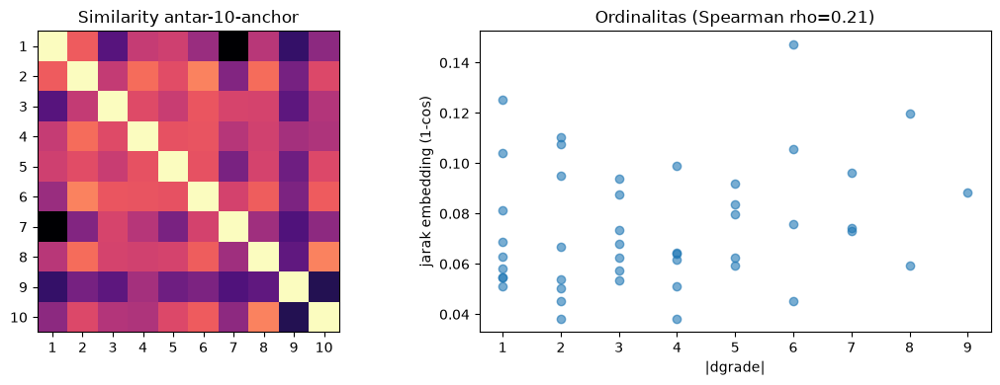

In [48]:
# === PROBE 3: konsistensi ordinal anchor (Spearman) ===
from scipy.stats import spearmanr
A = np.stack([dino_embed(load_roi(p)) for p in anchor_paths])
Sm = cosine_similarity(A); D = 1 - Sm                       # jarak embedding antar-anchor
iu = np.triu_indices(len(anchor_grades), 1)
gap  = np.abs(np.subtract.outer(anchor_grades, anchor_grades))[iu]
dist = D[iu]
rho, pval = spearmanr(gap, dist)
print(f"Spearman(|dgrade|, jarak embedding) = {rho:.3f}   (p={pval:.3g})")
print("Interpretasi: rho positif tinggi -> jarak embedding naik seiring selisih grade")
print("             -> ruang embedding 'paham' urutan keparahan AC (ordinal-aware).")

fig, ax = plt.subplots(1, 2, figsize=(11, 4))
ax[0].imshow(Sm, cmap="magma"); ax[0].set_title("Similarity antar-10-anchor")
ax[0].set_xticks(range(10)); ax[0].set_xticklabels(anchor_grades)
ax[0].set_yticks(range(10)); ax[0].set_yticklabels(anchor_grades)
ax[1].scatter(gap, dist, alpha=0.6); ax[1].set_xlabel("|dgrade|"); ax[1].set_ylabel("jarak embedding (1-cos)")
ax[1].set_title(f"Ordinalitas (Spearman rho={rho:.2f})")
plt.tight_layout(); plt.show()

## 6d. Evaluasi weak-label (kompas untuk tuning, tanpa dokter)

Nama file drg Laura menyandikan keparahan kasar (normal / diastema / crowding / crossbite /
protrusion / kelas 3). Kita petakan jadi skor keparahan, lalu ukur **korelasi Spearman** dengan
prediksi AC. Ini **bukan akurasi final** (bukan grade dokter) — tapi kompas objektif untuk
membandingkan setelan CONFIG: ubah 1 knob → lihat rho naik/turun.

In [49]:
from scipy.stats import spearmanr
# peta keyword -> keparahan kasar (silakan sesuaikan bobotnya)
SEVERITY = [("normal",1),("diastema",3),("open bite",5),("openbite",5),
            ("crowding",5),("midline",5),("crossbite",6),("deep bite",6),
            ("protrusion",6),("kelas 3",8)]
def weak_severity(name):
    n = name.lower(); sc = 1
    for kw,w in SEVERITY:
        if kw in n: sc = max(sc,w)
    return sc

weak  = np.array([weak_severity(n) for n in names])
preds = np.array([predict_ac(p)[1] for p in paths])      # AC weighted
rho, pval = spearmanr(weak, preds)
print(f"Spearman(keparahan-nama, prediksi AC) = {rho:.3f}  (p={pval:.3g})")
print("-> makin tinggi = prediksi makin selaras dgn keparahan klinis. Pakai sbg KOMPAS sweep CONFIG.\n")
for i in np.argsort(weak):
    print(f"  weak={weak[i]}  AC_pred={preds[i]:4.1f}   {names[i][:48]}")

Spearman(keparahan-nama, prediksi AC) = -0.170  (p=0.501)
-> makin tinggi = prediksi makin selaras dgn keparahan klinis. Pakai sbg KOMPAS sweep CONFIG.

  weak=1  AC_pred= 5.4   kelas 1 normal 1
  weak=1  AC_pred= 5.3   kelas 1 normal 2
  weak=1  AC_pred= 5.5   kelas 1 normal 3
  weak=3  AC_pred= 5.4   kelas 1 dengan diastema 1
  weak=3  AC_pred= 5.5   kelas 1 dengan diastema 2
  weak=5  AC_pred= 5.5   kelas 1 with upper anterior croeding and midline
  weak=5  AC_pred= 5.5   kelas 1 with crowding lower anterior 1
  weak=5  AC_pred= 5.3   kelas 1 with crowding lower anterior 2
  weak=5  AC_pred= 5.4   kelas 1 with upper anterior croeding and midline
  weak=5  AC_pred= 5.5   kelas 1 with upper anterior croeding and midline
  weak=5  AC_pred= 5.4   kelas 1 with multiple diastema and open bite ant
  weak=6  AC_pred= 5.3   kelas 1 with deep bite and protrusion 3
  weak=6  AC_pred= 5.4   kelas 1 with crowding, midline shifting, crossbi
  weak=6  AC_pred= 5.3   kelas 1 with deep bite and prot

## 7. Keterbatasan & langkah berikutnya

**Apa yang 8 foto Google ini BISA ajarkan** ✅ mekanika pipeline: encode → similarity → ranking, dan intuisi kenapa encoder semantik penting.

**Apa yang BELUM bisa** ❌
- **Belum ada 10 foto referensi AC resmi** → belum bisa grading sungguhan. *Kebutuhan #1.*
- **Belum ada label validasi** → belum bisa ukur MAE / within-±1. Kumpulkan ~30–50 foto yang di-grade manual (1–2 orang).
- **Belum ada crop ROI gigi** → watermark & bibir mengotori embedding. Tambah deteksi mulut/gigi (mis. mediapipe FaceMesh atau model deteksi gigi) untuk auto-crop.

**Urutan kerja yang disarankan**
1. Kumpulkan 10 foto referensi AC resmi (anchor).
2. Tambahkan crop ROI konsisten.
3. Bikin set validasi kecil berlabel → bandingkan DINOv2 vs baseline (MobileNet) pakai MAE & within-±1.
4. (Opsional) fine-tune triplet/ArcFace kalau sudah ada cukup pasangan berlabel.

## 8. Catatan deployment on-device (untuk nanti)

Prioritas sekarang **akurasi dulu**, jadi DINOv2 di MPS itu tepat. Saat mau ke on-device (iOS/mobile):

- **DINOv2 ViT-S** bisa dikonversi ke **Core ML** (`coremltools`), walau lebih berat dari CNN mobile.
- Alternatif ramah-mobile: **MobileCLIP** (Apple, ada ekspor Core ML resmi) atau **MobileNetV3 / EfficientNet-Lite**.
- Karena arsitekturnya sama (encoder → embedding → cosine ke anchor), kamu bisa **tukar encoder** tanpa mengubah logika grading. Jadi aman memulai dengan DINOv2 sekarang dan mengganti backbone saat optimasi on-device.